# Monthly vegetation condition anomalies

* **Products used:**
[ndvi_climatology_ls](https://explorer.digitalearth.africa/ndvi_climatology_ls), [wofs_ls_summary_alltime](https://explorer.digitalearth.africa/wofs_ls_summary_alltime),
[s2_ls2](https://explorer.digitalearth.africa/), [ls8_sr](https://explorer.digitalearth.africa/ls8_sr), [ls9_sr](https://explorer.digitalearth.africa/ls9_sr)

## Background
Understanding how the vegetated landscape responds to longer-term environmental drivers such as the El Nino Southern Oscillation (ENSO) or climate change, requires the calculation of standardised anomalies. Standardised anomalies subtract the long-term mean from an observation of interest and then divide the result by the long-term standard deviation, thus removing seasonal variability and highlighting change related to longer-term drivers.


### Description

This notebook will calculate monthly _standardised_ NDVI anomalies for any given month and year, and relies on DE Africa's 30 metre resolution [NDVI climatology](https://docs.digitalearthafrica.org/en/latest/data_specs/NDVI_Climatology_specs.html) product to define the baseline vegetation condition. Sentinel-2, and Landsat 8/9 are used to calculate the monthly mean NDVI for the month of interest. The standardised anomaly is then calculated as:
        
\begin{equation}
\text{Standardised anomaly }=\frac{x-m}{s}
\end{equation}

where $x$ is NDVI for the month of interest, $m$ is the long-term mean, and $s$ is the long-term standard deviation.

The following steps are taken in the notebook:
1. Load a polygon for the Kenyan county of interest (a geojson with the Kenyan counties boundaries is already provided)
2. Load cloud masked Sentinel-2 and Landsat satellite data
3. Preprocess the satellite data so we have one continuous, noise free time-series of NDVI.
4. Create mask of the county boundary
5. Load DE Africa's NDVI climatology product
6. Use WOfS to remove waterbodies from the region
7. Calculate standardised NDVI anomalies
8. Plot the NDVI anomalies

## Getting started
**To run this analysis**, run all the cells in the notebook, starting with the "Load packages" cell.

**After finishing the analysis**, return to the "Analysis parameters" cell, modify some values (e.g. choose a different location or time period to analyse) and re-run the analysis.

### Load packages
Load key Python packages and supporting functions for the analysis.

In [1]:
%matplotlib inline

import os
import datacube
import xarray as xr
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from datacube.utils import masking
from datacube.utils.geometry import Geometry, CRS
from deafrica_tools.spatial import xr_rasterize

from deafrica_tools.datahandling import load_ard
from deafrica_tools.bandindices import calculate_indices
from deafrica_tools.plotting import display_map
from deafrica_tools.dask import create_local_dask_cluster

## Set up a Dask cluster

Dask can be used to better manage memory use and conduct the analysis in parallel. 
For an introduction to using Dask with Digital Earth Africa, see the [Dask notebook](../Beginners_guide/08_Parallel_processing_with_dask.ipynb).

>**Note**: We recommend opening the Dask processing window to view the different computations that are being executed; to do this, see the *Dask dashboard in DE Africa* section of the [Dask notebook](../Beginners_guide/08_parallel_processing_with_dask.ipynb).

To use Dask, set up the local computing cluster using the cell below.

In [2]:
create_local_dask_cluster()

Client Scheduler: tcp://127.0.0.1:37815 Dashboard: /user/victoria@kartoza.com/proxy/8787/status,Cluster Workers: 1 Cores: 4 Memory: 28.14 GB


### Connect to the datacube
Activate the datacube database, which provides functionality for loading and displaying stored Earth observation data.

In [3]:
dc = datacube.Datacube(app="Vegetation_anomalies")

### Analysis parameters

The following cell sets important parameters for the analysis:

* `vector_file`: file path for the shapefile containing polygons for the boundaries of Kenyan counties
* `attribute_col`: The column in the "vector_file" containing the county names.
* `county`: In this analysis, we'll select a Kenyan County to mask the dataset and analysis.
* `anomaly_time_period`: The time period for which we will calculate the standardised anomaly.
* `resolution`: The x and y cell resolution of the satellite data and `ndvi_climatology_ls` data, e.g. `(-30, 30)` will load data at its native 30 x 30m resolution. If loading a large area, then increase the resolution so the data will fit into memory. For example, if trying to find the NDVI anomaly for a large country, consider increasing the resolution to `(-210,210)`.
* `output_crs` : The coordinate reference system that the loaded data is to be reprojected to.
* `measurements`:  The product bands to load.
* `dask_chunks`:  the size of the dask chunks, dask breaks data into manageable chunks that can be easily stored in memory, e.g. `dict(x=1000,y=1000)`
* `output_dir` :  The directory in which to store results from the analysis.
* `min_num_obs` : The minimum number of clear observations for creating a quality assurance mask for the NDVI climatology. The minimum number of clear observations should be ~20-30 observations.
* `water_threshold` : Value by which to threshold WOfS annual frequency to classify water/not-water.

**If running the notebook for the first time**, keep the default settings below.
This will demonstrate how the analysis works and provide meaningful results.


In [4]:
vector_file = "data/Kenya_Counties.geojson"
attribute_col = "COUNTY_NAME"

# Select a county, for the example we will use Turkana County, a complete list of counties is available below.
county = "Turkana"

anomaly_time_period = ("2021-10", "2022-03")

# pixel resolution can got as low as (-30,30) metres,
# but make larger for big areas.
resolution = (-120, 120)
output_crs = "EPSG:6933"

# how to chunk the dataset for use with dask
dask_chunks = dict(x=1000, y=1000)

# Create the output directory to store the results.
output_dir = "results"
os.makedirs(output_dir, exist_ok=True)

min_num_obs = 20

water_threshold = 0.30

### Load the Kenyan counties shapefile

This shapefile contains polygons for the boundaries of Kenyan counties and will allows us to calculate NDVI anomalies within a chosen county

In [5]:
kenyan_counties = gpd.read_file(vector_file)
kenyan_counties.explore()

### List counties

You can change the county in the analysis parameters cell to any Kenyan county. A complete list of counties is printed below.

In [6]:
print(np.unique(kenyan_counties[attribute_col]))

['Baringo' 'Bomet' 'Bungoma' 'Busia' 'Elgeyo-Marakwet' 'Embu' 'Garissa'
 'Homa Bay' 'Isiolo' 'Kajiado' 'Kakamega' 'Kericho' 'Kiambu' 'Kilifi'
 'Kirinyaga' 'Kisii' 'Kisumu' 'Kitui' 'Kwale' 'Laikipia' 'Lamu' 'Machakos'
 'Makueni' 'Mandera' 'Marsabit' 'Meru' 'Migori' 'Mombasa' "Murang'a"
 'Nairobi' 'Nakuru' 'Nandi' 'Narok' 'Nyamira' 'Nyandarua' 'Nyeri'
 'Samburu' 'Siaya' 'Taita Taveta' 'Tana River' 'Tharaka-Nithi'
 'Trans Nzoia' 'Turkana' 'Uasin Gishu' 'Vihiga' 'Wajir' 'West Pokot']


## Setup polygon

The county selected needs to be transformed into a geometry object to be used in the `load_ard` function.

In [7]:
idx = kenyan_counties[kenyan_counties[attribute_col] == county].index[0]
geom = Geometry(geom=kenyan_counties.iloc[idx].geometry, crs=kenyan_counties.crs)

## Load and process cloud-masked satellite data

The first step in this analysis is to load in Landsat 8/9 and Sentinel-2 data for the county we've picked, and for the time period of the anomaly we want to assess. 
The code below uses the `load_ard` function to load in data from Landsat 8/9 and Sentinel-2 satellites for the area and time specified.
For more information, see the [Using load_ard notebook](../../Frequently_used_code/Using_load_ard.ipynb).

The dictionary, `query`, maps the parameters we provided above to the `datacube.load()` parameters.


In [8]:
# Create the 'query' dictionary object for loading data form the datacube.
query = {
    "geopolygon": geom,
    "time": anomaly_time_period,
    "output_crs": output_crs,
    "resolution": resolution,
    "dask_chunks": dask_chunks,
}

Now let's load the satellite data.

In [9]:
# Load available data Landsat 8 and 9
ds_ls = load_ard(
    dc=dc,
    products=["ls8_sr", "ls9_sr"],
    group_by="solar_day",
    measurements=["red", "nir"],
    resampling={"pixel_quality": "nearest", "*": "average"},
    mask_filters=[("opening", 3), ("dilation", 3)],  # improve cloud-mask
    verbose=False,
    **query
)

# Load available sentinel2
ds_s2 = load_ard(
    dc=dc,
    products=["s2_l2a"],
    measurements=["red", "nir_2"],  # use nir narrow to match with LS8 nir
    group_by="solar_day",
    resampling={"pixel_quality": "nearest", "*": "average"},
    mask_filters=[("opening", 3), ("dilation", 3)],  # improve cloud-mask
    verbose=False,
    **query
)

/home/jovyan/Tools/deafrica_tools/datahandling.py:474: FutureWarning: xarray.ufuncs is deprecated. Instead, use numpy ufuncs directly.
  pq_mask = xr.ufuncs.logical_or(pq_mask, pq_mask)
/env/lib/python3.8/site-packages/xarray/core/dataarray.py:3088: FutureWarning: xarray.ufuncs is deprecated. Instead, use numpy ufuncs directly.
  f(self.variable, other_variable)
/env/lib/python3.8/site-packages/xarray/core/variable.py:2420: FutureWarning: xarray.ufuncs is deprecated. Instead, use numpy ufuncs directly.
  f(self_data, other_data) if not reflexive else f(other_data, self_data)


## Preprocess satellite data

Here we perform a number of steps to get the satellite data into the format we need for calculating an NDVI anomaly.
1. Rename the `'nir_2'` band in Sentinel-2 to `'nir'` so the `calculate_indices` function will understand to calculate NDVI using `'nir_2'`.
2. Calculate NDVI on both Landsat and Sentinel-2 data, then we concatenate the two time-series together.
3. Now that we have one continous time-series of NDVI, we can clean the time-series by removing data that is outside the range 0-1, and minimize the impact of noise/missed cloud by running a temporal rolling mean filter with a small window size.
4. Calculate the mean NDVI for each month in the analysis time period.
5. Mask the mean NDVI for each month using the county boundary.

In [10]:
# Rename to trick 'calculate_indices'.
ds_s2 = ds_s2.rename({"nir_2": "nir"})

# Calculate NDVI.
ndvi_s2 = calculate_indices(ds_s2, "NDVI", collection="s2", drop=True)
ndvi_ls = calculate_indices(ds_ls, "NDVI", collection="c2", drop=True)

# Concatenate ndvi_s2 and ndvi_ls together.
ndvi = xr.concat([ndvi_ls, ndvi_s2], dim="time").sortby("time")

# Remove NDVI's that aren't between 0 and 1.
ndvi = ndvi.where((ndvi >= 0) & (ndvi <= 1))

# Smooth out noise from missed cloud.
ndvi = ndvi.rolling(time=3, min_periods=1).mean()

Dropping bands ['red', 'nir']
Dropping bands ['red', 'nir']


In [11]:
# Summarise the ndvi into monthly means.
group_by_year = ndvi.groupby("time.year")
monthly_means_dict = {}
for year, year_group_ds in group_by_year:
    group_by_month = year_group_ds.groupby("time.month")
    for month, month_group_ds in group_by_month:
        label = f"{year}-{month}"
        monthly_mean = month_group_ds.mean("time")
        monthly_means_dict[label] = monthly_mean

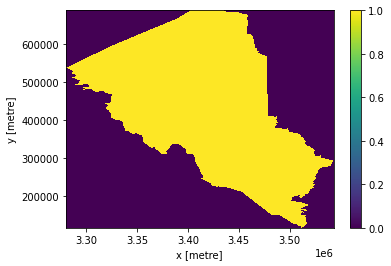

In [12]:
# Create a rasterized mask of the county boundary.
kenyan_counties = kenyan_counties.to_crs(output_crs)
mask = xr_rasterize(kenyan_counties[kenyan_counties[attribute_col] == county], ds_ls)

# Plot the mask.
mask.plot()

> Note that this cell will take several minutes to run (depending on size and resolution of the datasets) as here we trigger all of the calculations we've listed up to this point with the `.compute()` method

In [13]:
# Mask each monthly mean dataset using the county boundary.
for label, monthly_mean in monthly_means_dict.items():
    monthly_mean = monthly_mean.where(mask).compute()
    monthly_means_dict[label] = monthly_mean

CPLReleaseMutex: Error = 1 (Operation not permitted)


## Load DE Africa's NDVI climatologies


Due to the inconsistent data availability of Landsat 5 over equatorial Africa, and due to persistent cloud coverage over these same regions, the quality of the long-term NDVI baseline is poor in in some parts of Africa. We recommend not using relying on the product in locations where the clear obervation count is less than ~20-30 observations. Below this, the standard deviation layers are prone to data artefacts owing to temporal smoothing operations performing poorly on sparse datasets, and residual cloudy pixels not being sufficiently ‘averaged out’ by a decent volume of input data.

To enforce the above, make a quality assurance mask where clear observation count is low.

In [14]:
# Map months string numbers to a lower-case three letter abbreviation.
# This is because the ndvi_climatology_ls product's measurements are stored as 'mean_jan', 'mean_feb' etc.
months = {
    "1": "jan",
    "2": "feb",
    "3": "mar",
    "4": "apr",
    "5": "may",
    "6": "jun",
    "7": "jul",
    "8": "aug",
    "9": "sep",
    "10": "oct",
    "11": "nov",
    "12": "dec",
}

In [15]:
for label, monthly_mean in monthly_means_dict.items():
    month = label.split("-")[-1]
    ndvi_clim_measurements = [
        f"mean_{months[month]}",
        f"stddev_{months[month]}",
        f"count_{months[month]}",
    ]
    # Load the  NDVI climatologies for the month.
    ndvi_clim = dc.load(
        product="ndvi_climatology_ls",
        like=ds_ls.geobox,
        measurements=ndvi_clim_measurements,
        dask_chunks=dask_chunks,
    ).squeeze()
    # Create the quality assurance mask.
    qa_mask = ndvi_clim[f"count_{months[month]}"] >= min_num_obs
    # Remove pixels where the number of clear observations are less than the min_num_obs.
    ndvi_clim = ndvi_clim.where(qa_mask)
    # Mask the dataset using the county boundary.
    ndvi_clim = ndvi_clim.where(mask).compute()
    # Merge the monthly mean and the ndvi climatology dataset.
    monthly_mean_ndvi_clim = xr.merge([monthly_mean, ndvi_clim])
    # Replace the monthly mean dataset in the dictionary with the merged dataset.
    monthly_means_dict[label] = monthly_mean_ndvi_clim

## Remove water bodies

This will constrain all the NDVI anomaly observations to just the land mass.

In [16]:
# Load WOfS.
wofs = dc.load(
    product="wofs_ls_summary_alltime",
    measurements=["frequency"],
    like=ds_ls.geobox,
    dask_chunks=dask_chunks,
).frequency.squeeze()

# Set masked terrain regions to 0.
wofs = xr.where(xr.ufuncs.isnan(wofs), 0, wofs)

# Threshold to create waterbodies mask.
wofs = wofs < water_threshold

# Mask the wofs dataset with the county boundary.
wofs = wofs.where(mask).compute()

/tmp/ipykernel_898/1959919786.py:10: FutureWarning: xarray.ufuncs is deprecated. Instead, use numpy ufuncs directly.
  wofs = xr.where(xr.ufuncs.isnan(wofs), 0, wofs)
/env/lib/python3.8/site-packages/xarray/core/dataarray.py:3068: FutureWarning: xarray.ufuncs is deprecated. Instead, use numpy ufuncs directly.
  da = self.__array_wrap__(f(self.variable.data, *args, **kwargs))


In [17]:
for label, monthly_mean in monthly_means_dict.items():
    monthly_mean = monthly_mean.where(wofs)
    monthly_means_dict[label] = monthly_mean

## Calculate standardised anomalies and plot the NDVI climatology, monthly mean, and standardised anomaly

Now we can calculate the standardised anomalies by subtracting the long-term mean and dividing by the long-term standard deviation.

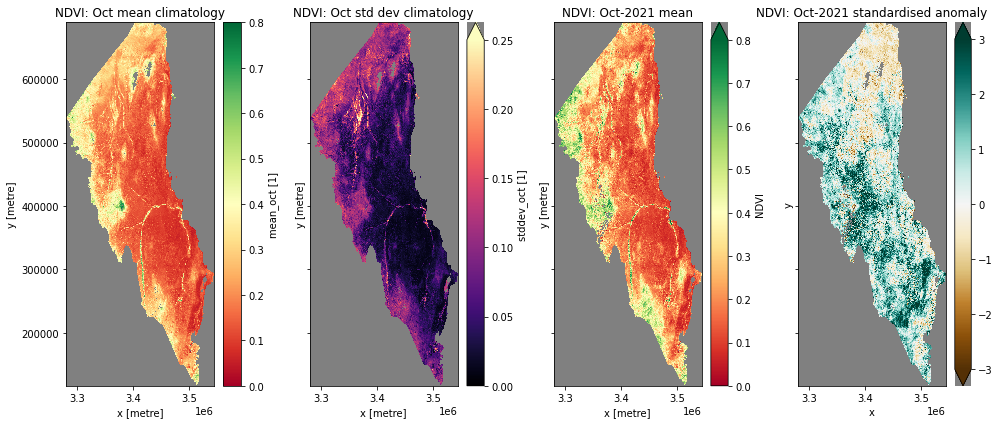

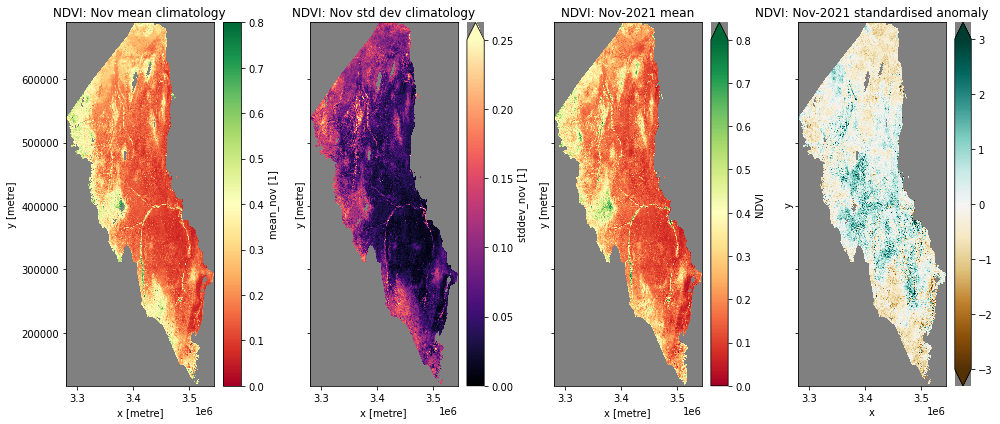

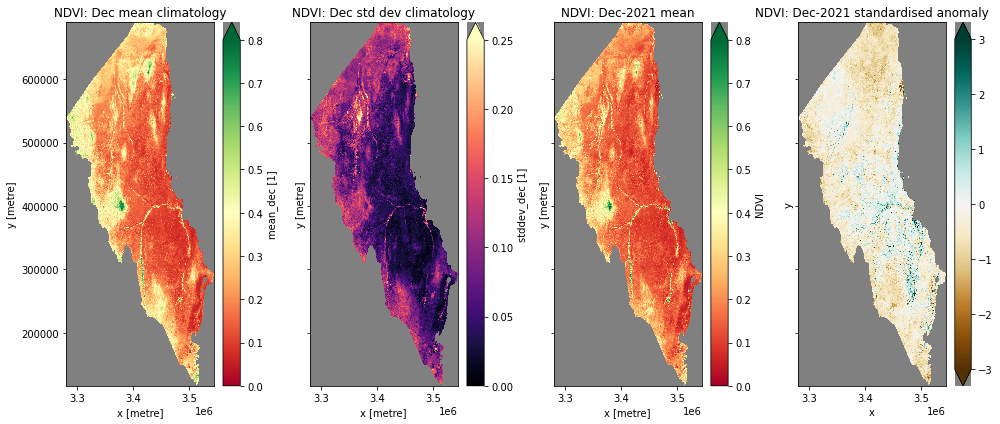

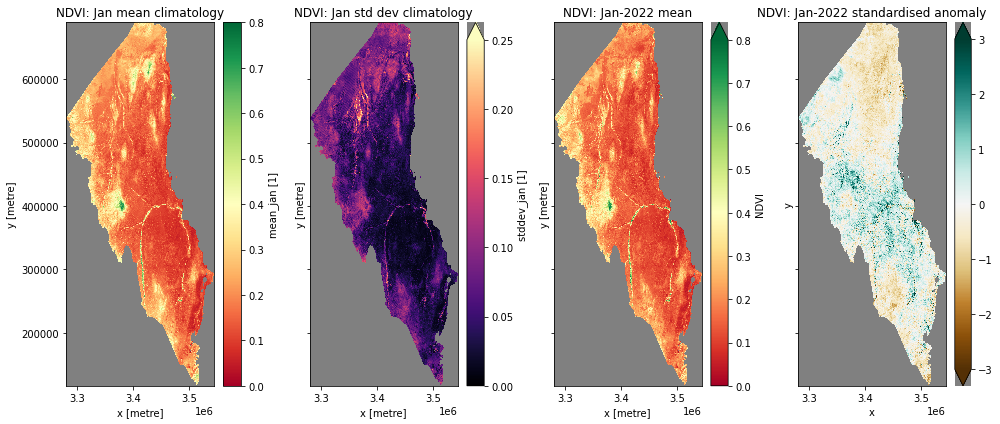

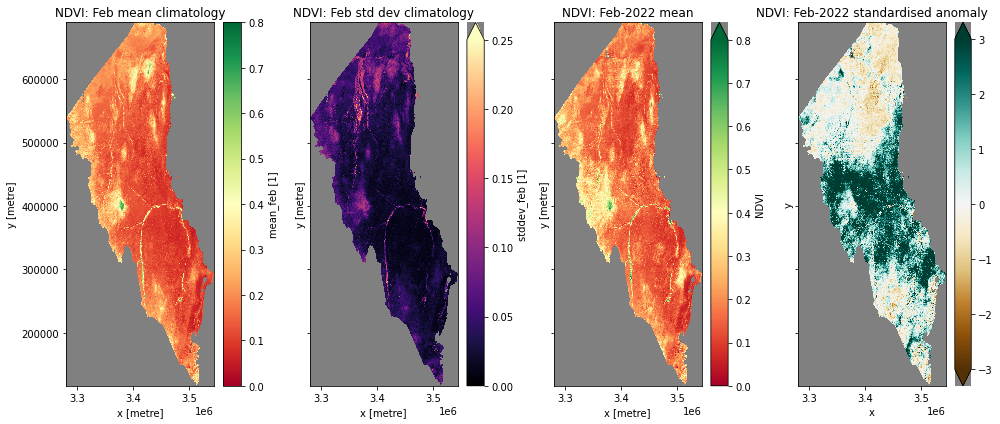

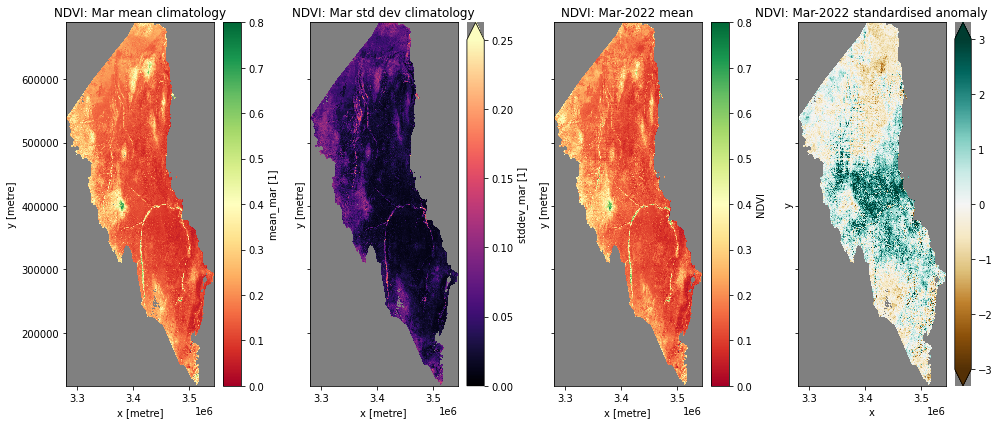

In [18]:
for label, monthly_mean_ds in monthly_means_dict.items():
    year = label.split("-")[0]
    month = label.split("-")[-1]

    monthly_mean = monthly_mean_ds["NDVI"]
    mean_clim = monthly_mean_ds[f"mean_{months[month]}"]
    std_clim = monthly_mean_ds[f"stddev_{months[month]}"]
    standardised_anomalies = xr.apply_ufunc(
        lambda x, m, s: (x - m) / s,
        monthly_mean,
        mean_clim,
        std_clim,
        output_dtypes=[monthly_mean.dtype],
        dask="allowed",
    )
    monthly_mean_ds["standardised_anomalies"] = standardised_anomalies
    monthly_means_dict[label] = monthly_mean_ds

    # Plot all the layers.
    plt.rcParams["axes.facecolor"] = "gray"  # makes transparent pixels obvious
    fig, ax = plt.subplots(1, 4, figsize=(14, 6), sharey=True)

    mean_clim.plot.imshow(ax=ax[0], cmap="RdYlGn", vmin=0, vmax=0.8)
    ax[0].set_title(f"NDVI: {months[month].title()} mean climatology")

    std_clim.plot.imshow(ax=ax[1], cmap="magma", vmin=0, vmax=0.25)
    ax[1].set_title(f"NDVI: {months[month].title()} std dev climatology")

    monthly_mean.plot.imshow(ax=ax[2], cmap="RdYlGn", vmin=0, vmax=0.8)
    ax[2].set_title(f"NDVI: {months[month].title()}-{year} mean")

    standardised_anomalies.plot.imshow(ax=ax[3], cmap="BrBG", vmin=-3, vmax=3)
    ax[3].set_title(f"NDVI: {months[month].title()}-{year} standardised anomaly")
    plt.tight_layout();

---

## Additional information

**License:** The code in this notebook is licensed under the [Apache License, Version 2.0](https://www.apache.org/licenses/LICENSE-2.0). 
Digital Earth Africa data is licensed under the [Creative Commons by Attribution 4.0](https://creativecommons.org/licenses/by/4.0/) license.

**Contact:** If you need assistance, please post a question on the [Open Data Cube Slack channel](http://slack.opendatacube.org/) or on the [GIS Stack Exchange](https://gis.stackexchange.com/questions/ask?tags=open-data-cube) using the `open-data-cube` tag (you can view previously asked questions [here](https://gis.stackexchange.com/questions/tagged/open-data-cube)).
If you would like to report an issue with this notebook, you can file one on [Github](https://github.com/digitalearthafrica/deafrica-sandbox-notebooks).

**Compatible datacube version:**

In [19]:
print(datacube.__version__)

1.8.6


**Last Tested:**

In [20]:
from datetime import datetime
datetime.today().strftime('%Y-%m-%d')

'2022-04-14'